# Scrap and Sentiment Analysis of My Fitness Pal Reviews App

### Muhammad Alarik Daviarsyah
### 5026221015

# Import Library

In [ ]:
!pip install google_play_scraper
!pip install textblob
!pip install seaborn

from google_play_scraper import app, Sort, reviews_all
import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.style.use('seaborn-v0_8')
plt.rcParams["figure.figsize"] = (15,10)

#Cleaning Data

In [ ]:
#Android App My Fitness Pal link from Google Play at
#https://play.google.com/store/apps/details?id=com.myfitnesspal.android
#The apps ID found in the link after id=com.myfitnesspal.android
#The apps name on Google Play titled: MyFitnessPal: Calorie Counter
#Dated 11 Maret 2025: number of reviews 2.81M++

from google_play_scraper import app, Sort, reviews_all

myfitnesspal_reviews = reviews_all(
   'com.myfitnesspal.android',
  sleep_milliseconds=0, # defaults to 0
   lang='en', # defaults to 'en'
   sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [ ]:
#Save the My Fitness Pal Apps reviews into dataframe
df_hdrev_raw = pd.DataFrame(np.array(myfitnesspal_reviews),columns=['content'])
df_hdrev_raw = df_hdrev_raw.join(pd.DataFrame(df_hdrev_raw.pop('content').tolist()))
df_hdrev_raw.to_csv(r'df_myfitnesspal.csv', index=False)

In [ ]:
df_hdrev_raw

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,5a6c8f80-5983-497a-a183-738004aa2662,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,The app worked a lot smoother before this last update.,3,0,25.11.0,2025-03-26 23:23:33,​Our apologies for any problems you are having. For additional support please visit: https://myfitnesspal.zendesk.com/hc/en-us/requests/new or send an email to support@myfitnesspal.com. ​,2025-03-27 13:45:39,25.11.0
1,99e77086-1ee4-4b13-a228-f3a37c58093b,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",1,0,None,2025-03-26 22:45:53,Thank you so much for this valuable feedback. We have passed this along to our team for further review.,2025-03-27 13:45:09,None
2,c6b93b7d-3cf6-4d95-96b9-c777ce04e370,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,awesome app,5,0,25.11.0,2025-03-26 22:37:30,None,NaT,25.11.0
3,49762946-4c60-4aaa-9315-f3aee49e9bb0,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,the macros change without me changing them. I saved them and they change on their own. not good!,1,1,25.11.0,2025-03-26 22:18:16,​Our apologies for any problems you are having. For additional support please visit: https://myfitnesspal.zendesk.com/hc/en-us/requests/new or send an email to support@myfitnesspal.com. ​,2025-03-27 13:44:04,25.11.0
4,b90666f8-f1b3-4a54-b628-5d2a1d65cc39,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,terrible,1,0,25.11.0,2025-03-26 21:30:30,None,NaT,25.11.0
...,...,...,...,...,...,...,...,...,...,...,...
656595,0bf7e621-e054-45a6-bc61-eb6d3688af2a,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",5,0,0.51,2010-07-22 01:01:28,None,NaT,0.51
656596,135e5ac8-7861-4863-988e-62fe34f586c9,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,5,0,0.50,2010-07-21 09:18:00,None,NaT,0.50
656597,034c2b10-d620-4110-b9fe-fcaaab27c48b,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,5,0,0.48,2010-07-17 01:19:44,None,NaT,0.48
656598,34d4a515-62c5-4147-be4f-328b3ef07502,A Google user,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",5,0,0.35,2010-07-02 18:13:48,None,NaT,0.35


In [ ]:
#Information on the table
df_hdrev = df_hdrev_raw
# menambahkan kolom id increment
df_hdrev['id'] = range(1, len(df_hdrev) + 1)
df_hdrev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 656600 entries, 0 to 656599
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   reviewId              656600 non-null  object        
 1   userName              656600 non-null  object        
 2   userImage             656600 non-null  object        
 3   content               652167 non-null  object        
 4   score                 656600 non-null  int64         
 5   thumbsUpCount         656600 non-null  int64         
 6   reviewCreatedVersion  617486 non-null  object        
 7   at                    656600 non-null  datetime64[ns]
 8   replyContent          63438 non-null   object        
 9   repliedAt             63438 non-null   datetime64[ns]
 10  appVersion            617486 non-null  object        
 11  id                    656600 non-null  int64         
dtypes: datetime64[ns](2), int64(3), object(7)
memory usage: 60

In [ ]:
#Memilih kolom yang ingin ditampilkan
df_hdrev = df_hdrev[['id', 'content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at']]
df_hdrev

,id,content,score,thumbsUpCount,reviewCreatedVersion,at
0,1,The app worked a lot smoother before this last update.,3,0,25.11.0,2025-03-26 23:23:33
1,2,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",1,0,None,2025-03-26 22:45:53
2,3,awesome app,5,0,25.11.0,2025-03-26 22:37:30
3,4,the macros change without me changing them. I saved them and they change on their own. not good!,1,1,25.11.0,2025-03-26 22:18:16
4,5,terrible,1,0,25.11.0,2025-03-26 21:30:30
...,...,...,...,...,...,...
656595,656596,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",5,0,0.51,2010-07-22 01:01:28
656596,656597,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,5,0,0.50,2010-07-21 09:18:00
656597,656598,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,5,0,0.48,2010-07-17 01:19:44
656598,656599,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",5,0,0.35,2010-07-02 18:13:48


##Step 1 - Remove Zero Scores from User Ratings

In [ ]:
#Menghapus kolom score yang memiliki nilai 0
df_hdrev = df_hdrev[df_hdrev['score'] != 0]

In [ ]:
#Check number of reviews scores
df_hdrev['score'].value_counts()

,count
score,
5,449267
4,110630
1,50161
3,27772
2,18718


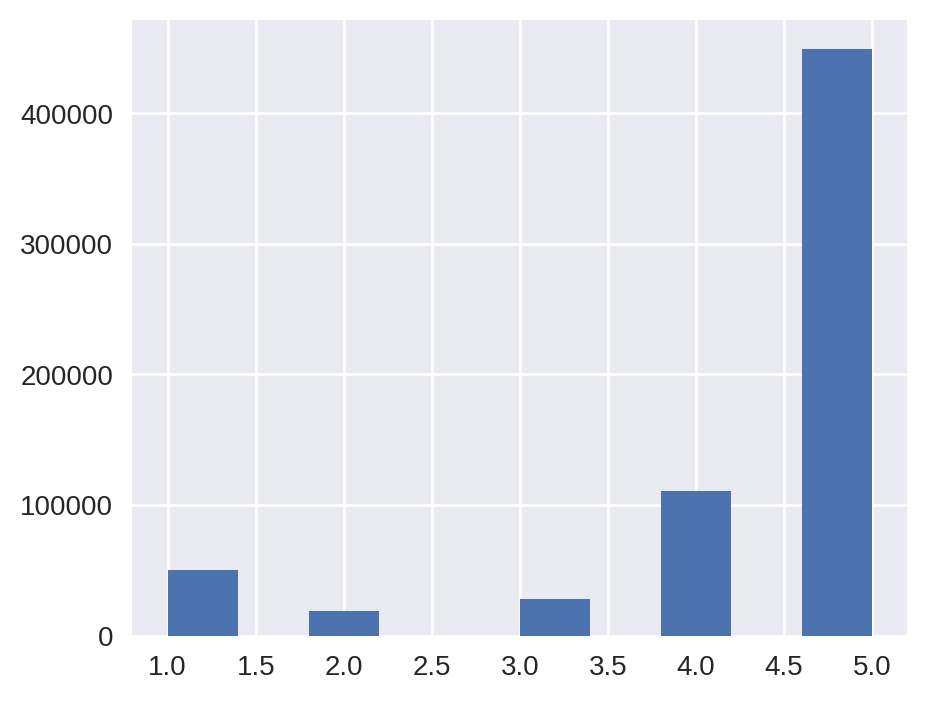

In [ ]:
# Menampilkan review score ke dalam bar chart
plt.figure(figsize=[5,4])
plt.hist(df_hdrev['score'])
plt.show()

##Step 2 - Remove Empty Review

In [ ]:
# Menghapus review yang kosong atau NaN
df_hdrev = df_hdrev.dropna(subset=['content'])  # Hapus NaN
df_hdrev = df_hdrev[df_hdrev['content'].str.strip() != '']  # Hapus string kosong setelah di-trim

In [ ]:
# Memeriksa apakah masih ada review kosong
df_hdrev[df_hdrev['content'].str.strip() == '']

,id,content,score,thumbsUpCount,reviewCreatedVersion,at


##Step 3 - Hapus review selain bahasa inggris

In [ ]:
print(df_hdrev_raw['content'][0])

The app worked a lot smoother before this last update.


In [ ]:
!pip install langdetect

In [ ]:
from langdetect import detect, LangDetectException
import pandas as pd
from collections import Counter

def detect_language(text):
    try:
        return detect(str(text))  # Pastikan teks dalam bentuk string
    except LangDetectException:
        return 'unknown'  # Jika error, kembalikan 'unknown'

# Terapkan fungsi ke kolom 'content'
df_hdrev['language'] = df_hdrev['content'].fillna('').apply(detect_language)

In [ ]:
# Hitung jumlah review berdasarkan bahasa
language_counts = Counter(df_hdrev['language'])
language_df = pd.DataFrame.from_dict(language_counts, orient='index', columns=['count'])
language_df.index.name = 'language'
language_df = language_df.sort_values(by=['count'], ascending=False).reset_index()

# Filter hanya review yang berbahasa Inggris
df_hdrev = df_hdrev[df_hdrev['language'] == 'en']

# Hapus kolom 'language' setelah digunakan
df_hdrev.drop(columns=['language'], inplace=True)

# Tampilkan distribusi bahasa
language_df


<ipython-input-79-219fafb46836>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hdrev.drop(columns=['language'], inplace=True)


,language,count
0,en,596729
1,af,10245
2,sl,5748
3,so,4505
4,ro,3607
5,fr,3513
6,ca,3313
7,it,3175
8,no,2714
9,nl,2227


In [ ]:
df_hdrev.info()

<class 'pandas.core.frame.DataFrame'>
Index: 596729 entries, 0 to 656599
Data columns (total 6 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    596729 non-null  int64         
 1   content               596729 non-null  object        
 2   score                 596729 non-null  int64         
 3   thumbsUpCount         596729 non-null  int64         
 4   reviewCreatedVersion  562501 non-null  object        
 5   at                    596729 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 31.9+ MB


In [ ]:

try:
  print(df_hdrev['content'][0])
except (KeyError, IndexError):
  print("content sudah dihapus")


The app worked a lot smoother before this last update.


#Data Preprocessing

In [ ]:
!pip install emoji
!pip install wordcloud

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

## Step 1 - Sentiment Polarity and Subjective Before Preprocessing

In [ ]:
#Creating polarity on the column: content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

from textblob import TextBlob
# Handle None values in 'content' column by replacing them with empty strings
df_hdrev['sentiment_polarity'] = df_hdrev['content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_hdrev['sentiment_subjective'] = df_hdrev['content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [ ]:
df_hdrev.loc[:,["id","content","score","sentiment_polarity", "sentiment_subjective"]]

,id,content,score,sentiment_polarity,sentiment_subjective
0,1,The app worked a lot smoother before this last update.,3,0.000000,0.066667
1,2,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",1,0.066667,0.493333
3,4,the macros change without me changing them. I saved them and they change on their own. not good!,1,0.081250,0.800000
5,6,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,2,-0.083333,0.750000
6,7,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",3,0.200000,0.200000
...,...,...,...,...,...
656595,656596,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",5,0.400000,0.675000
656596,656597,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,5,0.477778,0.644444
656597,656598,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,5,0.455208,0.416667
656598,656599,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",5,0.600000,0.950000


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_hdrev['sentiment_rating'] = df_hdrev['score'].apply(lambda x: 'Positive' if x > 3 else('Neutral' if x == 3  else 'Negative'))

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


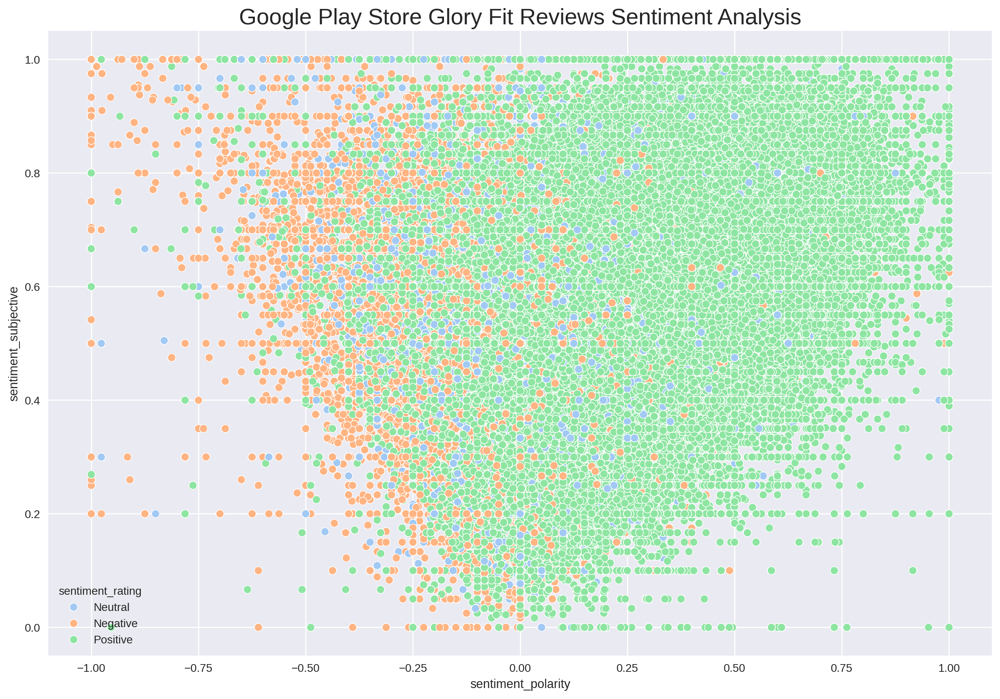

In [ ]:
plt.figure(figsize=(15, 10))
# Specify x and y using the 'x' and 'y' parameters within sns.scatterplot
sns.scatterplot(x=df_hdrev['sentiment_polarity'], y=df_hdrev['sentiment_subjective'],
                hue=df_hdrev['sentiment_rating'], edgecolor='white', palette="pastel")
plt.title("Google Play Store Glory Fit Reviews Sentiment Analysis", fontsize=20)
plt.show()

## Step 2 - Remove Special Characters (Emoji)

In [ ]:
# Fungsi untuk menghapus emoji dari teks
def remove_emojis(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Simbol & Piktograf
        u"\U0001F680-\U0001F6FF"  # Simbol Transportasi & Peta
        u"\U0001F1E0-\U0001F1FF"  # Bendera (iOS)
        u"\U00002500-\U00002BEF"  # Karakter Cina
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"  # Simbol Unicode tambahan
        u"\u2640-\u2642"  # Simbol Gender
        u"\u2600-\u2B55"  # Simbol Lainnya
        u"\u200d"  # Zero Width Joiner
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # Dingbats
        u"\u3030"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', text) if isinstance(text, str) else text  # Hanya proses jika teks

# Terapkan fungsi remove_emojis ke kolom 'content'
df_hdrev['cleaned_content'] = df_hdrev['content'].astype(str).apply(remove_emojis)

In [ ]:
#Menampilkan dataframe yang dipilih
df_hdrev.loc[:,["content","cleaned_content"]]

,content,cleaned_content
0,The app worked a lot smoother before this last update.,The app worked a lot smoother before this last update.
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.","Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk."
3,the macros change without me changing them. I saved them and they change on their own. not good!,the macros change without me changing them. I saved them and they change on their own. not good!
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...","I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen..."
...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!","I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,I love myfitnesspal even better now that i have the app installed on my phone for easy access.
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.","Loving this app, having it on my phone as well as on home computer is keeping me using it."


## Step 3 - Lower Case the Content

In [ ]:
# Mengubah tipe data kolom cleaned content menjadi string
df_hdrev.loc[:, 'cleaned_content'] = df_hdrev['cleaned_content'].astype(str)

In [ ]:
# # Mengubah semua teks di kolom 'content' menjadi huruf kecil
df_hdrev.loc[:, 'cleaned_content'] = df_hdrev['cleaned_content'].apply(lambda x: x.lower())

In [ ]:
#Menampilkan dataframe yang dipilih
df_hdrev.loc[:,["content","cleaned_content"]]

,content,cleaned_content
0,The app worked a lot smoother before this last update.,the app worked a lot smoother before this last update.
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.","interface is too busy. they removed the free scanner. don't think i'll pay, too expensive. i'll just use the yuki app for healthy alternatives and download a previous version of myfitnesspal apk."
3,the macros change without me changing them. I saved them and they change on their own. not good!,the macros change without me changing them. i saved them and they change on their own. not good!
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. have tried unlinking/reconnecting etc to no avail.
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...","i just switched phones and now the app is blank after logging in. i see the back arrow and ""myfitnesspal"" at the top, and ""dashboard"" , ""diary"", ""progress"" , and ""more"" at the bottom of the screen..."
...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!","i use the website everyday, and now i get to have it on my phone. it works great on mytouch slide!!!"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,i love myfitnesspal even better now that i have the app installed on my phone for easy access.
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,loving this app and was worth the wait! synched w/no issues on my droid x and does everything i need to log food & exercise. thanks mfp!!!
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.","loving this app, having it on my phone as well as on home computer is keeping me using it."


## Step 4 - Tokenizing

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt_tab')
# Tokenize the 'cleaned_text' column
df_hdrev['token'] = df_hdrev['cleaned_content'].apply(word_tokenize)

# Display the DataFrame with the tokens
display(df_hdrev[['content','cleaned_content', 'token']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,content,cleaned_content,token
0,The app worked a lot smoother before this last update.,the app worked a lot smoother before this last update.,"[the, app, worked, a, lot, smoother, before, this, last, update, .]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.","interface is too busy. they removed the free scanner. don't think i'll pay, too expensive. i'll just use the yuki app for healthy alternatives and download a previous version of myfitnesspal apk.","[interface, is, too, busy, ., they, removed, the, free, scanner, ., do, n't, think, i, 'll, pay, ,, too, expensive, ., i, 'll, just, use, the, yuki, app, for, healthy, alternatives, and, download,..."
3,the macros change without me changing them. I saved them and they change on their own. not good!,the macros change without me changing them. i saved them and they change on their own. not good!,"[the, macros, change, without, me, changing, them, ., i, saved, them, and, they, change, on, their, own, ., not, good, !]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. have tried unlinking/reconnecting etc to no avail.,"[having, issues, over, the, past, week, with, app, only, partly, syncing, with, fitbit, ., it, seems, to, only, sync, once, a, day, around, lunch, time, ., have, tried, unlinking/reconnecting, etc..."
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...","i just switched phones and now the app is blank after logging in. i see the back arrow and ""myfitnesspal"" at the top, and ""dashboard"" , ""diary"", ""progress"" , and ""more"" at the bottom of the screen...","[i, just, switched, phones, and, now, the, app, is, blank, after, logging, in, ., i, see, the, back, arrow, and, ``, myfitnesspal, '', at, the, top, ,, and, ``, dashboard, '', ,, ``, diary, '', ,,..."
...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!","i use the website everyday, and now i get to have it on my phone. it works great on mytouch slide!!!","[i, use, the, website, everyday, ,, and, now, i, get, to, have, it, on, my, phone, ., it, works, great, on, mytouch, slide, !, !, !]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,i love myfitnesspal even better now that i have the app installed on my phone for easy access.,"[i, love, myfitnesspal, even, better, now, that, i, have, the, app, installed, on, my, phone, for, easy, access, .]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,loving this app and was worth the wait! synched w/no issues on my droid x and does everything i need to log food & exercise. thanks mfp!!!,"[loving, this, app, and, was, worth, the, wait, !, synched, w/no, issues, on, my, droid, x, and, does, everything, i, need, to, log, food, &, exercise, ., thanks, mfp, !, !, !]"
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.","loving this app, having it on my phone as well as on home computer is keeping me using it.","[loving, this, app, ,, having, it, on, my, phone, as, well, as, on, home, computer, is, keeping, me, using, it, .]"


##Step 5 - Expand Contractions

In [ ]:
!pip install spacy
!pip install contractions
import spacy
import contractions

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import contractions

def expand_contractions(text):
    if isinstance(text, str) and text.strip():  # Pastikan teks tidak kosong setelah strip
        return contractions.fix(text)
    return text  # Kembalikan teks asli jika bukan string atau kosong

# Terapkan ekspansi kontraksi pada kolom 'cleaned_content'
df_hdrev['cleaned_content'] = df_hdrev['cleaned_content'].apply(expand_contractions)

# Tokenisasi setelah kontraksi diperluas
df_hdrev['token'] = df_hdrev['cleaned_content'].apply(lambda text: word_tokenize(text) if isinstance(text, str) else [])

# Tampilkan hasil
display(df_hdrev[['content', 'cleaned_content', 'token']])

,content,cleaned_content,token
0,The app worked a lot smoother before this last update.,the app worked a lot smoother before this last update.,"[the, app, worked, a, lot, smoother, before, this, last, update, .]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.","interface is too busy. they removed the free scanner. do not think i will pay, too expensive. i will just use the yuki app for healthy alternatives and download a previous version of myfitnesspal ...","[interface, is, too, busy, ., they, removed, the, free, scanner, ., do, not, think, i, will, pay, ,, too, expensive, ., i, will, just, use, the, yuki, app, for, healthy, alternatives, and, downloa..."
3,the macros change without me changing them. I saved them and they change on their own. not good!,the macros change without me changing them. i saved them and they change on their own. not good!,"[the, macros, change, without, me, changing, them, ., i, saved, them, and, they, change, on, their, own, ., not, good, !]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. have tried unlinking/reconnecting etc to no avail.,"[having, issues, over, the, past, week, with, app, only, partly, syncing, with, fitbit, ., it, seems, to, only, sync, once, a, day, around, lunch, time, ., have, tried, unlinking/reconnecting, etc..."
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...","i just switched phones and now the app is blank after logging in. i see the back arrow and ""myfitnesspal"" at the top, and ""dashboard"" , ""diary"", ""progress"" , and ""more"" at the bottom of the screen...","[i, just, switched, phones, and, now, the, app, is, blank, after, logging, in, ., i, see, the, back, arrow, and, ``, myfitnesspal, '', at, the, top, ,, and, ``, dashboard, '', ,, ``, diary, '', ,,..."
...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!","i use the website everyday, and now i get to have it on my phone. it works great on mytouch slide!!!","[i, use, the, website, everyday, ,, and, now, i, get, to, have, it, on, my, phone, ., it, works, great, on, mytouch, slide, !, !, !]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,i love myfitnesspal even better now that i have the app installed on my phone for easy access.,"[i, love, myfitnesspal, even, better, now, that, i, have, the, app, installed, on, my, phone, for, easy, access, .]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,loving this app and was worth the wait! synched w/no issues on my droid x and does everything i need to log food & exercise. thanks mfp!!!,"[loving, this, app, and, was, worth, the, wait, !, synched, w/no, issues, on, my, droid, x, and, does, everything, i, need, to, log, food, &, exercise, ., thanks, mfp, !, !, !]"
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.","loving this app, having it on my phone as well as on home computer is keeping me using it.","[loving, this, app, ,, having, it, on, my, phone, as, well, as, on, home, computer, is, keeping, me, using, it, .]"


##Step 6 - Punctuations Removal

In [ ]:
import re
import string

def cleaning_text(text):
    # Menambah spasi setelah koma jika tidak ada spasi
    text = re.sub(r",(?!\s)", ", ", text)
    # Menghapus tab, newline, backslash
    text = text.replace('\\t', " ").replace('\\n', " ").replace('\\u', " ").replace('\\', "")
    # Menghapus karakter non-ASCII (emoticon, huruf Cina, dll.)
    text = text.encode('ascii', 'replace').decode('ascii')
    # Menghapus URL
    text = re.sub(r"(?i)(?:https?:\/\/)?(?:www\.)?(?:[a-zA-Z0-9-.]+)(?:\.[a-zA-Z]{2,6})(?:\/[^\s\r\n]*)?", "", text)
    # Menghapus angka
    text = re.sub(r"\d+", "", text)
    # Menghapus tanda baca
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Menghapus whitespace berlebih dan karakter tunggal
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return re.sub(r"\b[a-zA-Z]\b", "", text)

# Terapkan fungsi pembersihan ke kolom content
df_hdrev['cleaned_content'] = df_hdrev['cleaned_content'].astype(str).apply(cleaning_text)

# Tokenisasi setelah kontraksi diperluas
df_hdrev['token'] = df_hdrev['cleaned_content'].apply(word_tokenize)


In [ ]:
df_hdrev.loc[:,["content","cleaned_content", "token"]]

,content,cleaned_content,token
0,The app worked a lot smoother before this last update.,the app worked lot smoother before this last update,"[the, app, worked, lot, smoother, before, this, last, update]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",interface is too busy they removed the free scanner do not think will pay too expensive will just use the yuki app for healthy alternatives and download previous version of myfitnesspal apk,"[interface, is, too, busy, they, removed, the, free, scanner, do, not, think, will, pay, too, expensive, will, just, use, the, yuki, app, for, healthy, alternatives, and, download, previous, versi..."
3,the macros change without me changing them. I saved them and they change on their own. not good!,the macros change without me changing them saved them and they change on their own not good,"[the, macros, change, without, me, changing, them, saved, them, and, they, change, on, their, own, not, good]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,having issues over the past week with app only partly syncing with fitbit it seems to only sync once day around lunch time have tried unlinkingreconnecting etc to no avail,"[having, issues, over, the, past, week, with, app, only, partly, syncing, with, fitbit, it, seems, to, only, sync, once, day, around, lunch, time, have, tried, unlinkingreconnecting, etc, to, no, ..."
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",just switched phones and now the app is blank after logging in see the back arrow and myfitnesspal at the top and dashboard diary progress and more at the bottom of the screen tapping any of the...,"[just, switched, phones, and, now, the, app, is, blank, after, logging, in, see, the, back, arrow, and, myfitnesspal, at, the, top, and, dashboard, diary, progress, and, more, at, the, bottom, of,..."
...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",use the website everyday and now get to have it on my phone it works great on mytouch slide,"[use, the, website, everyday, and, now, get, to, have, it, on, my, phone, it, works, great, on, mytouch, slide]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,love myfitnesspal even better now that have the app installed on my phone for easy access,"[love, myfitnesspal, even, better, now, that, have, the, app, installed, on, my, phone, for, easy, access]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,loving this app and was worth the wait synched wno issues on my droid and does everything need to log food exercise thanks mfp,"[loving, this, app, and, was, worth, the, wait, synched, wno, issues, on, my, droid, and, does, everything, need, to, log, food, exercise, thanks, mfp]"
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",loving this app having it on my phone as well as on home computer is keeping me using it,"[loving, this, app, having, it, on, my, phone, as, well, as, on, home, computer, is, keeping, me, using, it]"


##Step 7 - Before Stopwords removal

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def freq_words(x, terms=30):
    all_words = ' '.join(text for text in x)
    all_words = all_words.split()

    word_counts = Counter(all_words)  # Hitung frekuensi kata
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Pilih kata dengan frekuensi tertinggi
    d = words_df.nlargest(columns="count", n=terms)

    plt.figure(figsize=(20, 5))
    ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))
    ax.set(ylabel='Count')
    plt.xticks(rotation=45)  # Memiringkan label agar lebih mudah dibaca
    plt.show()

<ipython-input-98-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


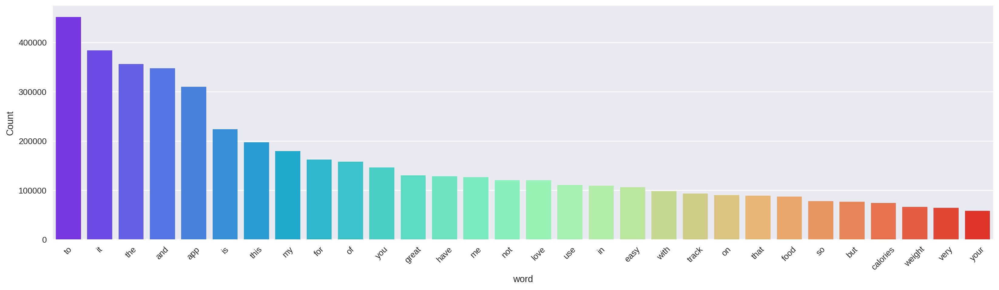

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_hdrev['cleaned_content'])

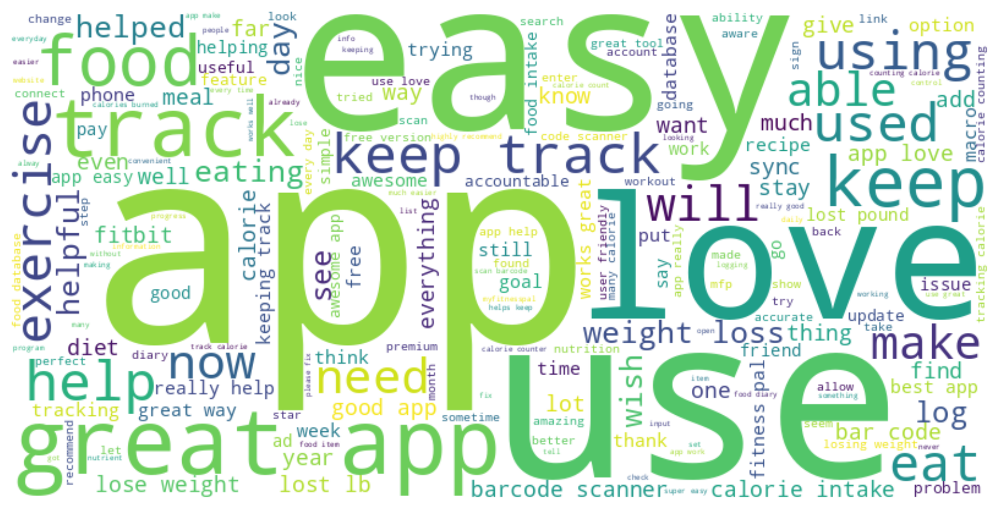

In [ ]:
# WordCloud setelah menghapus stopwords
all_words_after = ' '.join(df_hdrev['cleaned_content'])
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()

##Step 8 - Stopword Removal

In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Ambil daftar stopwords bahasa Inggris
english_stopwords = set(stopwords.words('english'))  # Gunakan set untuk akses lebih cepat

# Tambahkan kata tambahan ke dalam stopwords
english_stopwords.update(['app', 'used'])  # update() lebih efisien dibanding extend()

# Terapkan stopword removal ke setiap list token
df_hdrev["token"] = df_hdrev["token"].apply(lambda tokens: [word for word in tokens if isinstance(tokens, list) and word not in english_stopwords and word.isalpha()])

# Gabungkan token menjadi teks yang bersih dalam kolom cleaned_content
df_hdrev["cleaned_content"] = df_hdrev["token"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan hasil
display(df_hdrev[['content', 'cleaned_content', 'token']])


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,content,cleaned_content,token
0,The app worked a lot smoother before this last update.,worked lot smoother last update,"[worked, lot, smoother, last, update]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",interface busy removed free scanner think pay expensive use yuki healthy alternatives download previous version myfitnesspal apk,"[interface, busy, removed, free, scanner, think, pay, expensive, use, yuki, healthy, alternatives, download, previous, version, myfitnesspal, apk]"
3,the macros change without me changing them. I saved them and they change on their own. not good!,macros change without changing saved change good,"[macros, change, without, changing, saved, change, good]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,issues past week partly syncing fitbit seems sync day around lunch time tried unlinkingreconnecting etc avail,"[issues, past, week, partly, syncing, fitbit, seems, sync, day, around, lunch, time, tried, unlinkingreconnecting, etc, avail]"
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",switched phones blank logging see back arrow myfitnesspal top dashboard diary progress bottom screen tapping nothing content middle screen cleared apps data also uninstalled reinstalled,"[switched, phones, blank, logging, see, back, arrow, myfitnesspal, top, dashboard, diary, progress, bottom, screen, tapping, nothing, content, middle, screen, cleared, apps, data, also, uninstalle..."
...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",use website everyday get phone works great mytouch slide,"[use, website, everyday, get, phone, works, great, mytouch, slide]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,love myfitnesspal even better installed phone easy access,"[love, myfitnesspal, even, better, installed, phone, easy, access]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,loving worth wait synched wno issues droid everything need log food exercise thanks mfp,"[loving, worth, wait, synched, wno, issues, droid, everything, need, log, food, exercise, thanks, mfp]"
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",loving phone well home computer keeping using,"[loving, phone, well, home, computer, keeping, using]"


<ipython-input-98-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


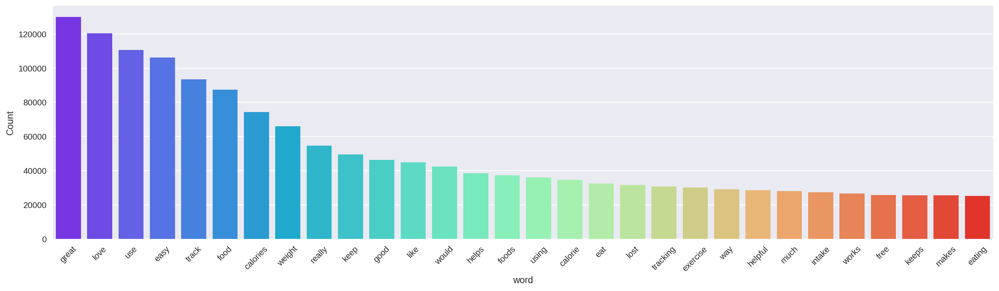

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_hdrev['cleaned_content'])

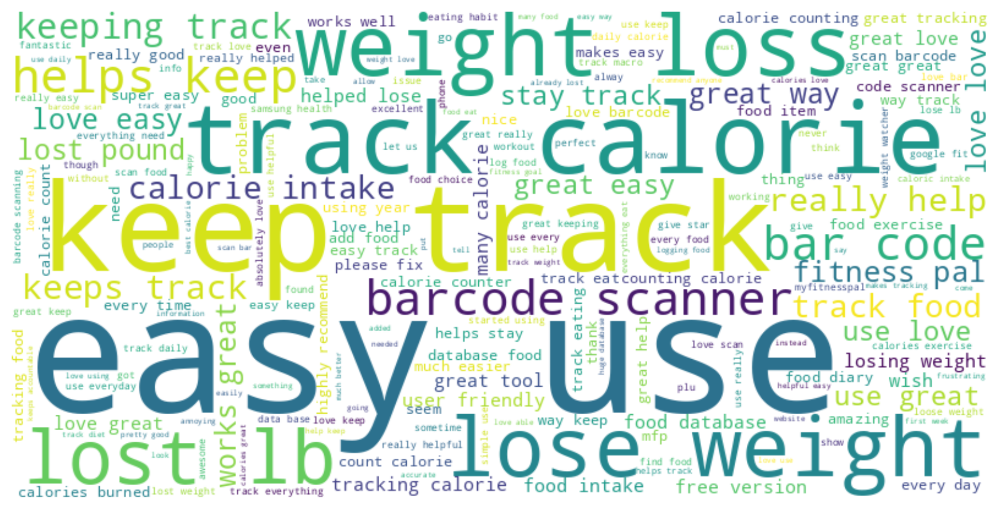

In [ ]:
# WordCloud setelah menghapus stopwords
all_words_after = ' '.join(df_hdrev['cleaned_content'])
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()

##Step 9 - Stemming & Lemmatization

In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
nltk.download('wordnet')
nltk.download('omw-1.4')  # Tambahan untuk lemmatization yang lebih baik

# Inisialisasi lemmatizer dan stemmer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

# Fungsi untuk lemmatization dengan memastikan token adalah list
def lemmatize_tokens(tokens):
    if isinstance(tokens, list):
        return [lemmatizer.lemmatize(word, pos='v') for word in tokens]
    return tokens  # Jika bukan list, kembalikan data asli untuk menghindari error

# Fungsi untuk stemming dengan memastikan token adalah list
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(word) for word in tokens]
    return tokens  # Jika bukan list, kembalikan data asli untuk menghindari error

# Terapkan lemmatization ke kolom token
df_hdrev["token"] = df_hdrev["token"].apply(lemmatize_tokens)

# Terapkan stemming ke kolom token
df_hdrev["token_after_stem"] = df_hdrev["token"].apply(stem_tokens)

# Gabungkan kembali token setelah lemmatization menjadi satu string
df_hdrev["cleaned_content"] = df_hdrev["token"].apply(lambda tokens: ' '.join(tokens) if isinstance(tokens, list) else tokens)

# Tampilkan hasil
display(df_hdrev[['content', 'cleaned_content', 'token' , 'token_after_stem']])


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


,content,cleaned_content,token,token_after_stem
0,The app worked a lot smoother before this last update.,work lot smoother last update,"[work, lot, smoother, last, update]","[work, lot, smoother, last, updat]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",interface busy remove free scanner think pay expensive use yuki healthy alternatives download previous version myfitnesspal apk,"[interface, busy, remove, free, scanner, think, pay, expensive, use, yuki, healthy, alternatives, download, previous, version, myfitnesspal, apk]","[interfac, busi, remov, free, scanner, think, pay, expens, use, yuki, healthi, altern, download, previou, version, myfitnessp, apk]"
3,the macros change without me changing them. I saved them and they change on their own. not good!,macros change without change save change good,"[macros, change, without, change, save, change, good]","[macro, chang, without, chang, save, chang, good]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,issue past week partly sync fitbit seem sync day around lunch time try unlinkingreconnecting etc avail,"[issue, past, week, partly, sync, fitbit, seem, sync, day, around, lunch, time, try, unlinkingreconnecting, etc, avail]","[issu, past, week, partli, sync, fitbit, seem, sync, day, around, lunch, time, tri, unlinkingreconnect, etc, avail]"
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",switch phone blank log see back arrow myfitnesspal top dashboard diary progress bottom screen tap nothing content middle screen clear apps data also uninstalled reinstall,"[switch, phone, blank, log, see, back, arrow, myfitnesspal, top, dashboard, diary, progress, bottom, screen, tap, nothing, content, middle, screen, clear, apps, data, also, uninstalled, reinstall]","[switch, phone, blank, log, see, back, arrow, myfitnessp, top, dashboard, diari, progress, bottom, screen, tap, noth, content, middl, screen, clear, app, data, also, uninstal, reinstal]"
...,...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",use website everyday get phone work great mytouch slide,"[use, website, everyday, get, phone, work, great, mytouch, slide]","[use, websit, everyday, get, phone, work, great, mytouch, slide]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,love myfitnesspal even better instal phone easy access,"[love, myfitnesspal, even, better, instal, phone, easy, access]","[love, myfitnessp, even, better, instal, phone, easi, access]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,love worth wait synched wno issue droid everything need log food exercise thank mfp,"[love, worth, wait, synched, wno, issue, droid, everything, need, log, food, exercise, thank, mfp]","[love, worth, wait, synch, wno, issu, droid, everyth, need, log, food, exercis, thank, mfp]"
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",love phone well home computer keep use,"[love, phone, well, home, computer, keep, use]","[love, phone, well, home, comput, keep, use]"


##Step 10 - Rare Words Removal

In [ ]:
from nltk.probability import FreqDist

def remove_rare_words(tokens, min_frequency=2):
    if isinstance(tokens, list):
        word_counts = FreqDist(tokens)
        return [word for word in tokens if word_counts[word] >= min_frequency]
    return tokens

# Apply rare word removal
df_hdrev["token_after_rare_removal"] = df_hdrev["token"].apply(remove_rare_words)

# Display the result
display(df_hdrev[['content', 'cleaned_content', 'token', 'token_after_stem', 'token_after_rare_removal']])


,content,cleaned_content,token,token_after_stem,token_after_rare_removal
0,The app worked a lot smoother before this last update.,work lot smoother last update,"[work, lot, smoother, last, update]","[work, lot, smoother, last, updat]",[]
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",interface busy remove free scanner think pay expensive use yuki healthy alternatives download previous version myfitnesspal apk,"[interface, busy, remove, free, scanner, think, pay, expensive, use, yuki, healthy, alternatives, download, previous, version, myfitnesspal, apk]","[interfac, busi, remov, free, scanner, think, pay, expens, use, yuki, healthi, altern, download, previou, version, myfitnessp, apk]",[]
3,the macros change without me changing them. I saved them and they change on their own. not good!,macros change without change save change good,"[macros, change, without, change, save, change, good]","[macro, chang, without, chang, save, chang, good]","[change, change, change]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,issue past week partly sync fitbit seem sync day around lunch time try unlinkingreconnecting etc avail,"[issue, past, week, partly, sync, fitbit, seem, sync, day, around, lunch, time, try, unlinkingreconnecting, etc, avail]","[issu, past, week, partli, sync, fitbit, seem, sync, day, around, lunch, time, tri, unlinkingreconnect, etc, avail]","[sync, sync]"
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",switch phone blank log see back arrow myfitnesspal top dashboard diary progress bottom screen tap nothing content middle screen clear apps data also uninstalled reinstall,"[switch, phone, blank, log, see, back, arrow, myfitnesspal, top, dashboard, diary, progress, bottom, screen, tap, nothing, content, middle, screen, clear, apps, data, also, uninstalled, reinstall]","[switch, phone, blank, log, see, back, arrow, myfitnessp, top, dashboard, diari, progress, bottom, screen, tap, noth, content, middl, screen, clear, app, data, also, uninstal, reinstal]","[screen, screen]"
...,...,...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",use website everyday get phone work great mytouch slide,"[use, website, everyday, get, phone, work, great, mytouch, slide]","[use, websit, everyday, get, phone, work, great, mytouch, slide]",[]
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,love myfitnesspal even better instal phone easy access,"[love, myfitnesspal, even, better, instal, phone, easy, access]","[love, myfitnessp, even, better, instal, phone, easi, access]",[]
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,love worth wait synched wno issue droid everything need log food exercise thank mfp,"[love, worth, wait, synched, wno, issue, droid, everything, need, log, food, exercise, thank, mfp]","[love, worth, wait, synch, wno, issu, droid, everyth, need, log, food, exercis, thank, mfp]",[]
656598,"Loving this app, having it on my phone as well as on home computer is keeping me using it.",love phone well home computer keep use,"[love, phone, well, home, computer, keep, use]","[love, phone, well, home, comput, keep, use]",[]


##Step 11 - Common Words Removal

In [ ]:
from nltk.probability import FreqDist

def common_words_removal(tokens, threshold=5):
    fdist = FreqDist(tokens)
    common_words = set([word for word, freq in fdist.items() if freq >= threshold])
    return [word for word in tokens if word not in common_words]

# Apply common words removal to 'token'
df_hdrev['token_after_cwr'] = df_hdrev['token'].apply(common_words_removal)

# Tampilkan hasil
display(df_hdrev[['content', 'cleaned_content', 'token', 'token_after_stem', 'token_after_rare_removal', 'token_after_cwr']])

,content,cleaned_content,token,token_after_stem,token_after_rare_removal,token_after_cwr
0,The app worked a lot smoother before this last update.,work lot smoother last update,"[work, lot, smoother, last, update]","[work, lot, smoother, last, updat]",[],"[work, lot, smoother, last, update]"
1,"Interface is too busy. they removed the free scanner. Don't think I'll pay, too expensive. I'll just use the Yuki app for healthy alternatives and download a previous version of myfitnesspal apk.",interface busy remove free scanner think pay expensive use yuki healthy alternatives download previous version myfitnesspal apk,"[interface, busy, remove, free, scanner, think, pay, expensive, use, yuki, healthy, alternatives, download, previous, version, myfitnesspal, apk]","[interfac, busi, remov, free, scanner, think, pay, expens, use, yuki, healthi, altern, download, previou, version, myfitnessp, apk]",[],"[interface, busy, remove, free, scanner, think, pay, expensive, use, yuki, healthy, alternatives, download, previous, version, myfitnesspal, apk]"
3,the macros change without me changing them. I saved them and they change on their own. not good!,macros change without change save change good,"[macros, change, without, change, save, change, good]","[macro, chang, without, chang, save, chang, good]","[change, change, change]","[macros, change, without, change, save, change, good]"
5,having issues over the past week with app only partly syncing with fitbit. it seems to only sync once a day around lunch time. Have tried unlinking/reconnecting etc to no avail.,issue past week partly sync fitbit seem sync day around lunch time try unlinkingreconnecting etc avail,"[issue, past, week, partly, sync, fitbit, seem, sync, day, around, lunch, time, try, unlinkingreconnecting, etc, avail]","[issu, past, week, partli, sync, fitbit, seem, sync, day, around, lunch, time, tri, unlinkingreconnect, etc, avail]","[sync, sync]","[issue, past, week, partly, sync, fitbit, seem, sync, day, around, lunch, time, try, unlinkingreconnecting, etc, avail]"
6,"I just switched phones and now the app is blank after logging in. I see the back arrow and ""MyFitnessPal"" at the top, and ""Dashboard"" , ""Diary"", ""Progress"" , and ""More"" at the bottom of the screen...",switch phone blank log see back arrow myfitnesspal top dashboard diary progress bottom screen tap nothing content middle screen clear apps data also uninstalled reinstall,"[switch, phone, blank, log, see, back, arrow, myfitnesspal, top, dashboard, diary, progress, bottom, screen, tap, nothing, content, middle, screen, clear, apps, data, also, uninstalled, reinstall]","[switch, phone, blank, log, see, back, arrow, myfitnessp, top, dashboard, diari, progress, bottom, screen, tap, noth, content, middl, screen, clear, app, data, also, uninstal, reinstal]","[screen, screen]","[switch, phone, blank, log, see, back, arrow, myfitnesspal, top, dashboard, diary, progress, bottom, screen, tap, nothing, content, middle, screen, clear, apps, data, also, uninstalled, reinstall]"
...,...,...,...,...,...,...
656595,"I use the website everyday, and now I get to have it on my phone. It works great on mytouch slide!!!",use website everyday get phone work great mytouch slide,"[use, website, everyday, get, phone, work, great, mytouch, slide]","[use, websit, everyday, get, phone, work, great, mytouch, slide]",[],"[use, website, everyday, get, phone, work, great, mytouch, slide]"
656596,I love myfitnesspal even better now that i have the app installed on my phone for easy access.,love myfitnesspal even better instal phone easy access,"[love, myfitnesspal, even, better, instal, phone, easy, access]","[love, myfitnessp, even, better, instal, phone, easi, access]",[],"[love, myfitnesspal, even, better, instal, phone, easy, access]"
656597,Loving this app and was worth the wait! Synched w/no issues on my Droid X and does everything I need to log food & exercise. Thanks MFP!!!,love worth wait synched wno issue droid everything need log

#Result

##Apply Sentiment Rating

In [ ]:
#Creating polarity on the column: cleaned_content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

from textblob import TextBlob
# Handle None values in 'cleaned_content' column by replacing them with empty strings
df_hdrev['sentiment_polarity'] = df_hdrev['cleaned_content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_hdrev['sentiment_subjective'] = df_hdrev['cleaned_content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [ ]:
df_hdrev.loc[:,["id","cleaned_content","score","sentiment_polarity", "sentiment_subjective"]]

,id,cleaned_content,score,sentiment_polarity,sentiment_subjective
0,1,work lot smoother last update,3,0.000000,0.066667
1,2,interface busy remove free scanner think pay expensive use yuki healthy alternatives download previous version myfitnesspal apk,1,0.066667,0.493333
3,4,macros change without change save change good,1,0.700000,0.600000
5,6,issue past week partly sync fitbit seem sync day around lunch time try unlinkingreconnecting etc avail,2,-0.250000,0.250000
6,7,switch phone blank log see back arrow myfitnesspal top dashboard diary progress bottom screen tap nothing content middle screen clear apps data also uninstalled reinstall,3,0.120000,0.176667
...,...,...,...,...,...
656595,656596,use website everyday get phone work great mytouch slide,5,0.300000,0.675000
656596,656597,love myfitnesspal even better instal phone easy access,5,0.477778,0.644444
656597,656598,love worth wait synched wno issue droid everything need log food exercise thank mfp,5,0.400000,0.350000
656598,656599,love phone well home computer keep use,5,0.500000,0.600000


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_hdrev['sentiment_rating'] = df_hdrev['score'].apply(lambda x: 'Positive' if x > 3 else('Neutral' if x == 3  else 'Negative'))

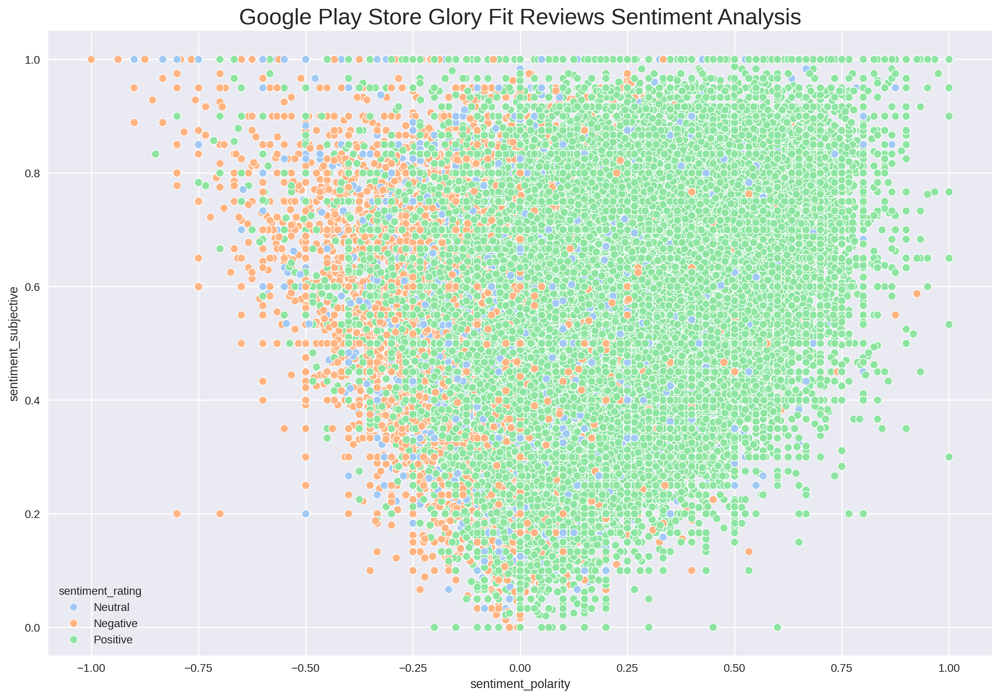

In [ ]:
plt.figure(figsize=(15, 10))
# Specify x and y using the 'x' and 'y' parameters within sns.scatterplot
sns.scatterplot(x=df_hdrev['sentiment_polarity'], y=df_hdrev['sentiment_subjective'],
                hue=df_hdrev['sentiment_rating'], edgecolor='white', palette="pastel")
plt.title("Google Play Store Glory Fit Reviews Sentiment Analysis", fontsize=20)
plt.show()

Dari scatter plot analisis sentimen dari ulasan Halodoc di Google Play Stor didapatkan penjelasan :

- **Sumbu X (sentiment_polarity)**: Menunjukkan polaritas sentimen dari ulasan, dengan nilai berkisar dari -1 (sangat negatif) hingga 1 (sangat positif). Nilai mendekati 0 menunjukkan sentimen netral.

- **Sumbu Y (sentiment_subjective)**: Menunjukkan tingkat subjektivitas dari ulasan, dengan nilai berkisar dari 0 (sangat objektif) hingga 1 (sangat subjektif).

- **Warna Titik (sentiment_rating)**:
  - **Biru (Positive)**: Menunjukkan ulasan dengan sentimen positif.
  - **Hijau (Negative)**: Menunjukkan ulasan dengan sentimen negatif.
  - **Orange (Neutral)**: Menunjukkan ulasan dengan sentimen netral.


In [ ]:
df_hdrev.info()

<class 'pandas.core.frame.DataFrame'>
Index: 596729 entries, 0 to 656599
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   id                        596729 non-null  int64         
 1   content                   596729 non-null  object        
 2   score                     596729 non-null  int64         
 3   thumbsUpCount             596729 non-null  int64         
 4   reviewCreatedVersion      562501 non-null  object        
 5   at                        596729 non-null  datetime64[ns]
 6   sentiment_polarity        596729 non-null  float64       
 7   sentiment_subjective      596729 non-null  float64       
 8   sentiment_rating          596729 non-null  object        
 9   cleaned_content           596729 non-null  object        
 10  token                     596729 non-null  object        
 11  token_after_stem          596729 non-null  object        
 12  token_a

##Frequent Word

<ipython-input-98-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


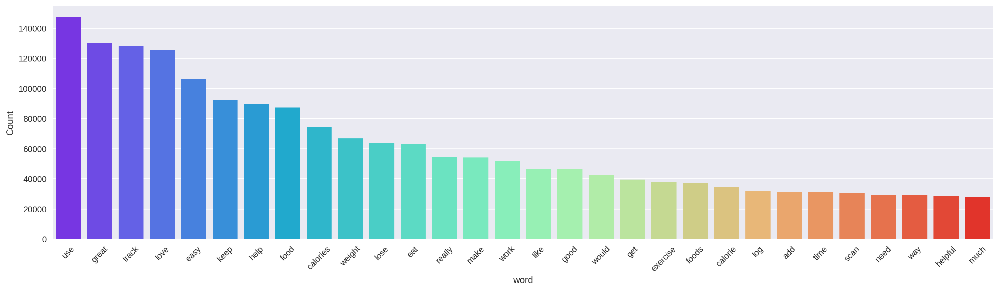

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_hdrev['cleaned_content'])

##WordCloud of Cleaned Content

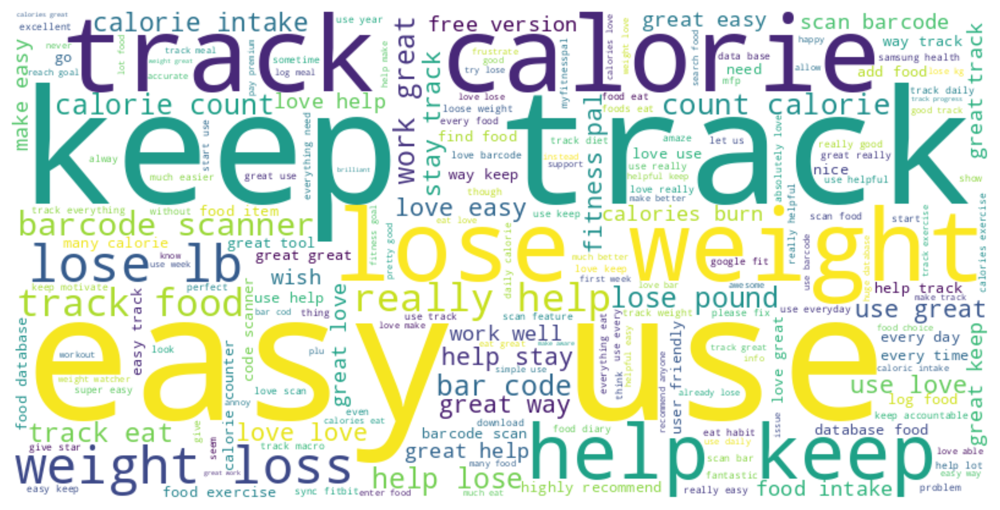

In [ ]:
# WordCloud setelah menghapus stopwords
all_words_after = ' '.join(df_hdrev['cleaned_content'])
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()

##Top 5 Frequent Words

In [ ]:
from collections import Counter
import pandas as pd

def freq_words_top5(x):
    all_words = ' '.join(text for text in x)
    all_words = all_words.split()
    word_counts = Counter(all_words)
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})
    d = words_df.nlargest(columns="count", n=5)
    return d

# Assuming df_hdrev is your DataFrame
top_5_words = freq_words_top5(df_hdrev['cleaned_content'])
top_5_words


,word,count
13,use,147483
188,great,129914
81,track,128034
92,love,125659
108,easy,106151


In [ ]:
df_hdrev.to_csv('df_hdrev_clean.csv', index=False)


## Distribution of Score Values

In [ ]:
df_hdrev['score'].value_counts()

,count
score,
5,401363
4,102892
1,47522
3,26694
2,18258


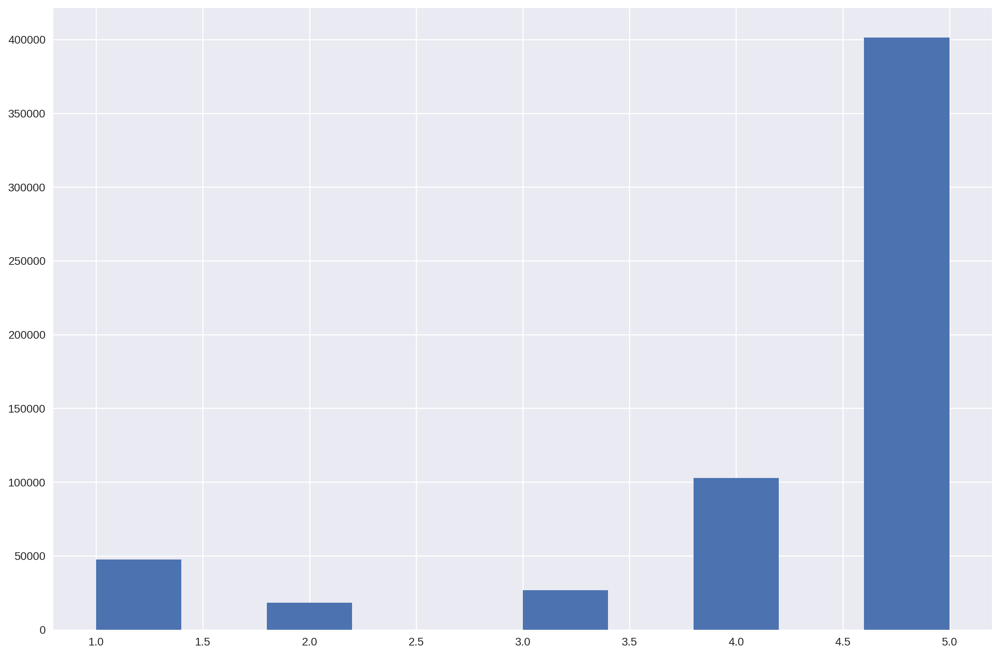

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df_hdrev['score'])
plt.show()

#Exploratory Data Analysis (EDA)

##Total Reviews Per Year

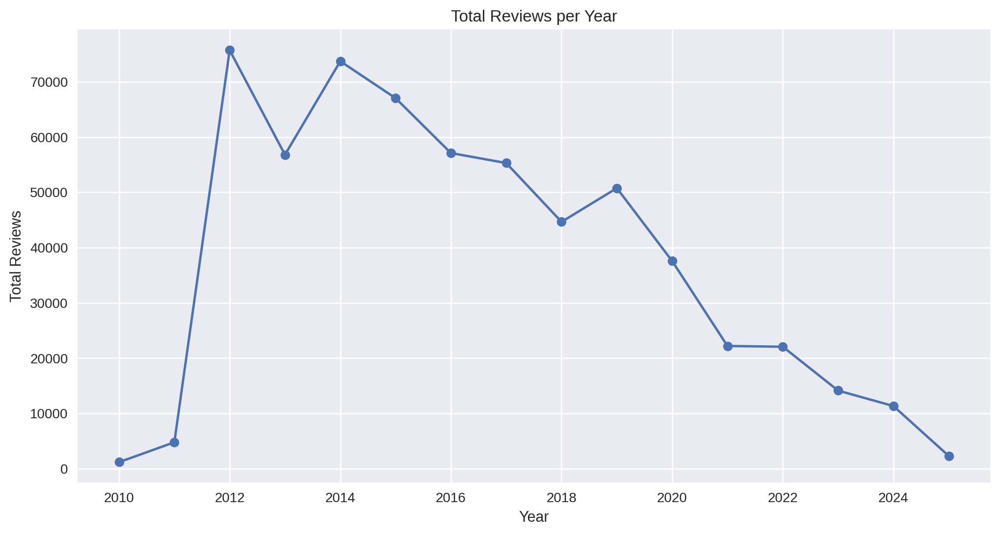

In [ ]:
# Assuming df_hdrev is your DataFrame and 'at' column contains datetime objects
# Convert 'at' column to datetime objects if it's not already
df_hdrev['at'] = pd.to_datetime(df_hdrev['at'])

# Extract year and month
df_hdrev['year'] = df_hdrev['at'].dt.year
df_hdrev['month'] = df_hdrev['at'].dt.month

# Group by year and count reviews
yearly_reviews = df_hdrev.groupby('year')['id'].count()

# Group by year and month, then count reviews
monthly_reviews = df_hdrev.groupby(['year', 'month'])['id'].count()

# Create the line chart for total reviews per year
plt.figure(figsize=(12, 6))
plt.plot(yearly_reviews.index, yearly_reviews.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Year')
plt.grid(True)
plt.show()

##Total Reviews Per Month for Each Year

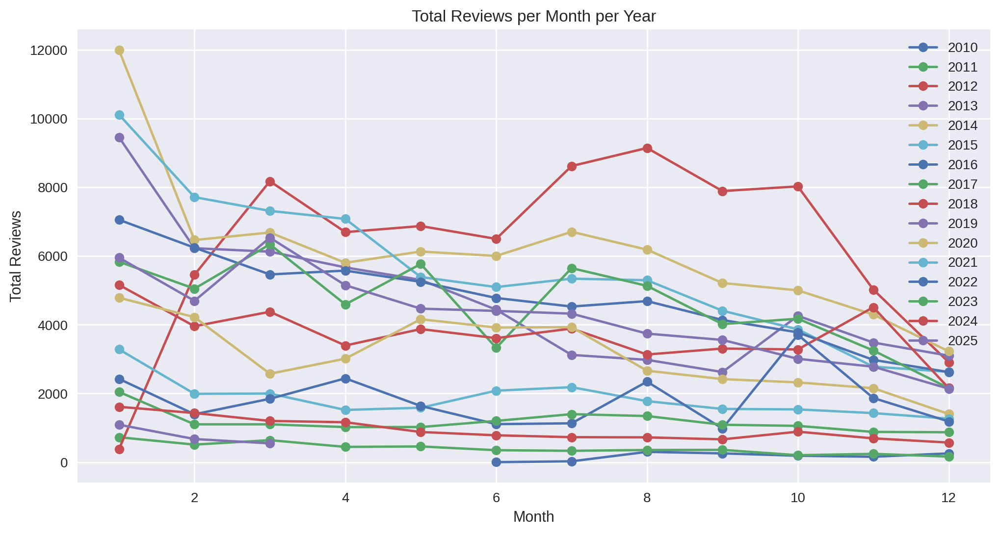

In [ ]:

# Create the line chart for total reviews per month per year
plt.figure(figsize=(12, 6))
for year in monthly_reviews.index.get_level_values(0).unique():
    year_data = monthly_reviews[year]
    plt.plot(year_data.index, year_data.values, marker='o', label=str(year))

plt.xlabel('Month')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Month per Year')
plt.legend()
plt.grid(True)
plt.show()


##Yearly Distribution of Review Scores

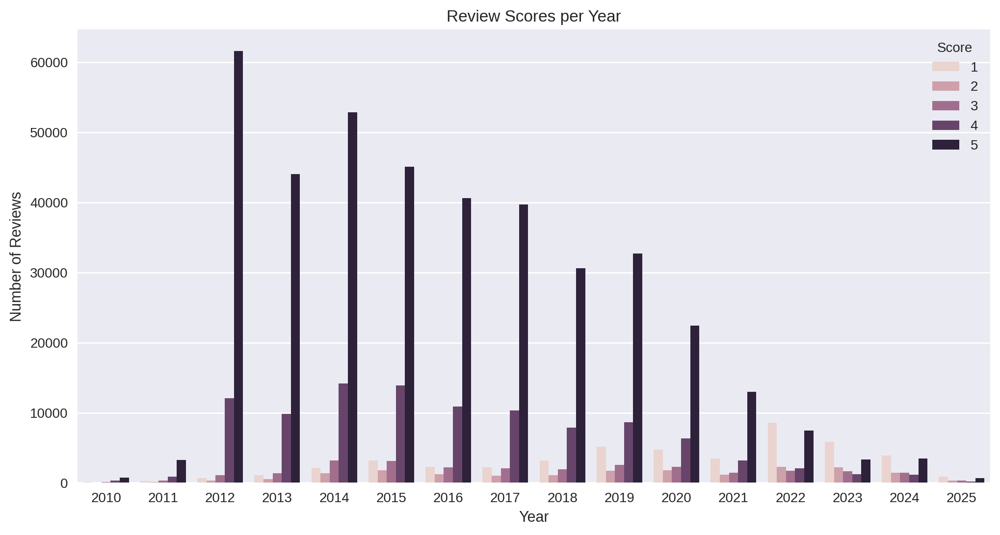

score,1,2,3,4,5
year,,,,,
2010,68,23,73,282,740
2011,273,125,300,844,3243
2012,694,302,1108,12040,61569
2013,1097,537,1357,9793,44021
2014,2127,1365,3214,14155,52862
2015,3148,1747,3120,13907,45120
2016,2250,1230,2185,10865,40583
2017,2231,984,2073,10319,39696
2018,3207,1046,1918,7859,30632


In [ ]:
# prompt: count for each score peryear with barchart

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_hdrev is your DataFrame and it's already loaded
# ... (your existing code to load and process df_hdrev)

# Group data by year and score, then count occurrences
score_per_year = df_hdrev.groupby(['year', 'score'])['id'].count().reset_index()

# Create the bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='id', hue='score', data=score_per_year)
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.title('Review Scores per Year')
plt.legend(title='Score')
plt.show()

# Assuming df_hdrev is your DataFrame and it has 'year' and 'score' columns
score_per_year = df_hdrev.groupby('year')['score'].value_counts().unstack(fill_value=0)
score_per_year


##Word Cloud for Positive and Negative Sentiments

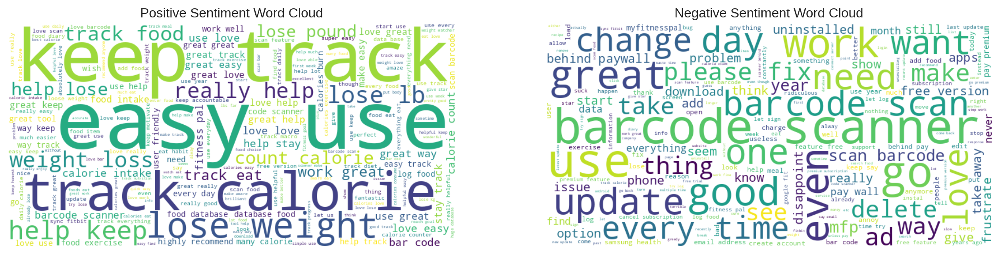

In [ ]:
# prompt: make a wordcloud for negative sentiment and positive sentiment

import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming df_hdrev is your DataFrame and 'cleaned_content' and 'sentiment_rating' columns exist

# Separate positive and negative reviews
positive_reviews = df_hdrev[df_hdrev['sentiment_rating'] == 'Positive']['cleaned_content']
negative_reviews = df_hdrev[df_hdrev['sentiment_rating'] == 'Negative']['cleaned_content']

# Create word clouds
positive_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(positive_reviews))
negative_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(negative_reviews))

# Display the word clouds
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Sentiment Word Cloud")

plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Sentiment Word Cloud")

plt.show()
